[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/googlecolab/colabtools/blob/master/notebooks/colab-github-demo.ipynb)

Install the wormpose package if needed. 

In [ ]:
!pip install --upgrade wormpose

If using Google Colab, please **restart the runtime** after installing the package: menu "Runtime" > "Restart runtime".

You can also select a GPU node for faster training: menu "Runtime" > "Change Runtime Type" > select "GPU" in the menu "Hardware Accelerator"

In [1]:
%load_ext autoreload
%autoreload 2

We first download some utility functions to display images:

In [2]:
!wget https://raw.githubusercontent.com/iteal/wormpose/main/examples/ipython_utils.py

--2024-05-28 12:34:04--  https://raw.githubusercontent.com/iteal/wormpose/main/examples/ipython_utils.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.109.133, 185.199.108.133, 185.199.111.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.109.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1721 (1.7K) [text/plain]
Saving to: ‘ipython_utils.py.1’

ipython_utils.py.1  100%[===================>]   1.68K  --.-KB/s    in 0s      

2024-05-28 12:34:05 (31.9 MB/s) - ‘ipython_utils.py.1’ saved [1721/1721]



## Download sample data

The sample data is composed of a set of images and a h5 file containing the features.

In [ ]:
sample_data_root = 'wormpose_data'
import os, shutil
if os.path.exists(sample_data_root):
    shutil.rmtree(sample_data_root)
os.mkdir(sample_data_root)
!git clone https://github.com/iteal/wormpose_data.git

## Set inputs

We load the sample data dataset using the "sample_data" default loader, and set the path of the dataset.

In [3]:
import os
from wormpose.config import default_paths
from wormpose.dataset.loader import load_dataset

# We have different loaders for different datasets, we use "sample_data" for the tutorial data,
# replace with "tierpsy" for Tierpsy tracker data, or with your custom dataset loader name
dataset_loader = "sample_data"

# Set the path to the dataset,
# for Tierpsy tracker data this will be the root path of a folder containing subfolders for each videos

#TODO: The below path should be made relative to the work dir
dataset_path = "/home/kosmas-deligkaris/repositories/wormpose_data/datasets/sample_data"

print(f"Using the default dataset loader: \'{dataset_loader}\', to load the sample dataset images and labels,\n from the folder \'{dataset_path}\'.\n")
dataset_root_name = os.path.basename(os.path.normpath(dataset_path))

#TODO:work dir is somehow "experiments", need to figure this out.
project_dir = os.path.join(default_paths.WORK_DIR, dataset_root_name)

# Set if the worm is lighter than the background in the image
# in the sample data, the worm is darker so we set this variable to False
worm_is_lighter = False

# This function loads the dataset
# optional fields: there is an optional resize parameter to resize the images
# also you can select specific videos from the dataset instead of loading them all
dataset = load_dataset(dataset_loader, dataset_path, worm_is_lighter=worm_is_lighter)

Using the default dataset loader: 'sample_data', to load the sample dataset images and labels,
 from the folder '/home/kosmas-deligkaris/repositories/wormpose_data/datasets/sample_data'.



### Visualize the raw dataset images

First, we simply display the first 100 frames of the first video the dataset. These are the raw dataset images.

In [4]:
from ipython_utils import ImagesViewer

MAX_FRAMES = 100
img_viewer = ImagesViewer()

video_name = dataset.video_names[0]
with dataset.frames_dataset.open(video_name) as frames:
    for frame in frames[:MAX_FRAMES]:
        img_viewer.add_image(frame)
        
img_viewer.view_as_slider()

interactive(children=(IntSlider(value=0, description='index', max=99), Output()), _dom_classes=('widget-intera…

### Visualize the synthetic images

The postures model generates worm postures, that we can use to draw a synthetic image representing that posture.
You can run the cell below to visualize a small sample of such generated images.

In [4]:
%matplotlib inline
import matplotlib.pyplot as plt
import tempfile
from wormpose.demo.synthetic_simple_visualizer import SyntheticSimpleVisualizer
from ipython_utils import ImagesViewer, display_as_slider

synth_viz = SyntheticSimpleVisualizer(dataset_loader,
                                      dataset_path, 
                                      worm_is_lighter=worm_is_lighter).generate()
img_viewer, img_viewer_plot = ImagesViewer(), ImagesViewer()
num_images = 50

print(f"Viewing {num_images} synthetic images.")
tempdir = tempfile.gettempdir()
for i in range(num_images):

    synth_image, theta = next(synth_viz)

    plt.plot(theta)
    plt.ylabel("theta (rad)")
    plt.xlabel("body segment")
    plot_path = os.path.join(tempdir, f"theta_{i}.png")
    plt.savefig(plot_path)
    plt.clf()
    img_viewer_plot.add_image_filename(plot_path)

    img_viewer.add_image(synth_image)

display_as_slider(img_viewer, img_viewer_plot)

Viewing 50 synthetic images.


interactive(children=(IntSlider(value=0, description='index', max=49), Output()), _dom_classes=('widget-intera…

<Figure size 640x480 with 0 Axes>

### Visualize the frame preprocessing

You can run the cell below to visualize a sample of the real images after they have been processed : they are cropped (or extended) to the same size which corresponds to the average worm length, and the background and non worm objects pixels are set to a uniform color. In that way, they become visually similar to the synthetic images.

In [ ]:
from wormpose.demo.real_simple_visualizer import RealSimpleVisualizer
from ipython_utils import ImagesViewer, display_as_slider

viz = RealSimpleVisualizer(dataset_loader, 
                           dataset_path, 
                           worm_is_lighter=worm_is_lighter).generate()
orig_img_viewer, processed_img_viewer = ImagesViewer(), ImagesViewer()

max_viz = 100
print(f"Displaying the first {max_viz} frames : original and processed.")

for _ in range(max_viz):
    orig_image, processed_image = next(viz)
    orig_img_viewer.add_image(orig_image)
    processed_img_viewer.add_image(processed_image)

display_as_slider(orig_img_viewer, processed_img_viewer)

print(f"The processed images are all set to the size: ({processed_image.shape[0]}px, {processed_image.shape[1]}px).")

Displaying the first 100 frames : original and processed.


interactive(children=(IntSlider(value=0, description='index', max=99), Output()), _dom_classes=('widget-intera…

The processed images are all set to the size: (90px, 90px).


## Calibration

We use a pixel comparison function to compare a real labelled image to its reconstruction as a synthetic image, which assigns a score between 0 (worse) and 1 (perfect reconstruction).
This function will be used to evaluate the predictions by comparing them to the original image, and filtering bad results with a threshold.

To decide on which threshold to use, we can evaluate this image score function on real labelled images from the dataset. The resulting distribution of scores should be close to 1 if the features are correct. We can visualize the real and the synthetic image that was used for the scoring. Here for example we display 5 examples that represent the range of results from worst to best.

2024-05-17 10:38:32.357388: I external/local_tsl/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2024-05-17 10:38:32.359730: I external/local_tsl/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2024-05-17 10:38:32.385429: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-05-17 10:38:32.988168: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
INFO:wormpose.commands.calibrate_dataset:
	dataset_loader: sample_data, 
	dataset_path: /home/kosmas-deligkaris/repositories/wormpose_data/datasets/sample_data
INFO:wormpose.commands.calibrate_dataset:
	worm_is_lighter: False, 
	save_images: True, 
	num_samples: 500, 
	work_d

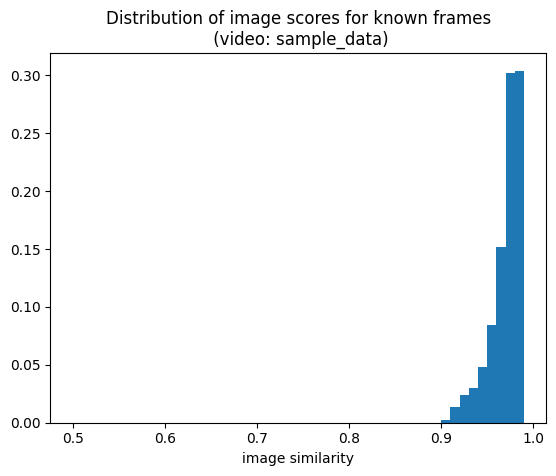

0.9099177122116089


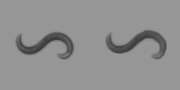

0.9599403738975525


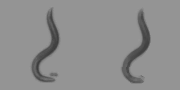

0.971976101398468


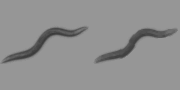

0.978438675403595


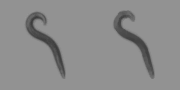

0.9940060973167419


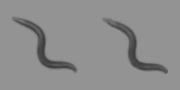

In [6]:
import numpy as np
import h5py
import matplotlib.pyplot as plt
from wormpose.commands import calibrate
from ipython_utils import ImagesViewer

video_name, result_file = next(calibrate(dataset_loader, 
                                         dataset_path, 
                                         worm_is_lighter=worm_is_lighter,
                                         save_images=True))

VIEW_SCORES = 5

img_viewer = ImagesViewer()
with h5py.File(result_file, "r") as f:
    scores = f['scores'][()]
    real_images = f['real_images']
    synthetic_images = f['synth_images']

    plt.hist(scores, bins=np.arange(0.5, 1, 0.01), 
             weights=np.ones_like(scores)/len(scores))
    plt.xlabel("image similarity")
    plt.title(f"Distribution of image scores for known frames\n (video: {video_name})")
    plt.show()
    
    sorted_scores = np.argsort(scores)
    step = int(len(sorted_scores)/VIEW_SCORES)
    sorted_selection_index = [sorted_scores[0]] + sorted_scores[step:-step:step].tolist() + [sorted_scores[-1]]

    for index in sorted_selection_index:
        im = np.hstack([real_images[index], synthetic_images[index]])
        img_viewer.add_image(im)
    
img_viewer.view_as_list(legends=scores[sorted_selection_index])

## Build the training and evaluation dataset
We now build the training dataset which contain images such as above, saved as a binary file ".tfrecord". We also build an evaluation dataset. 

We create a small training set of 1000 images for this tutorial. For a more representative training set, increase the value of num_train_samples (the default value is 500k), but the generation will take more time.

In [7]:
from wormpose.commands import generate
from ipywidgets import FloatProgress
from IPython.display import display

fp = FloatProgress(min=0., max=1.)
display(fp)

gen_progress = generate(dataset_loader,
                        dataset_path,
                        worm_is_lighter=worm_is_lighter,
                        num_train_samples=1000)
for progress_value in gen_progress:
    fp.value = progress_value

FloatProgress(value=0.0, max=1.0)

INFO:wormpose.commands.generate_training_data:
	dataset_loader: sample_data, 
	dataset_path: /home/kosmas-deligkaris/repositories/wormpose_data/datasets/sample_data
INFO:wormpose.commands.generate_training_data:
	worm_is_lighter: False, 
	num_train_samples: 1000, 
	num_process: 32, 
	temp_dir: /tmp/tmp_gfym799, 
	num_eval_samples: 10000, 
	work_dir: experiments, 
	postures_generation: <bound method PosturesModel.generate of <wormpose.pose.postures_model.PosturesModel object at 0x7428046c5f60>>, 
	video_names: None, 
	random_seed: None, 
	resize_options: <wormpose.dataset.loaders.resizer.ResizeOptions object at 0x7428dad445b0>
2024-05-17 10:38:49.172175: I external/local_tsl/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2024-05-17 10:38:49.174323: I external/local_tsl/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2024-05-17 10:38:49.218950: I tensorflow/core/platform/cpu_feature_guard.cc:21

## Check generated tfrecord files

We check that the tfrecord files have been generated successfully by viewing the first few images.

In [8]:
from glob import glob
import os
from wormpose.config import default_paths
from wormpose.machine_learning import tfrecord_file
from ipython_utils import ImagesViewer


def view_tfrecord(filename, theta_dims=100, max_viz=100):
    img_viewer = ImagesViewer()
    for index, record in enumerate(tfrecord_file.read(filename, theta_dims)):
        if index >= max_viz:
            break
        image_data = record[0].numpy()
        img_viewer.add_image(image_data)   
    print(f"Reading: \'{filename}\' ({index} first frames)")

    img_viewer.view_as_slider() 

train_records = list(sorted(glob(os.path.join(project_dir, 
                                              default_paths.TRAINING_DATA_DIR,
                                              default_paths.SYNTH_TRAIN_DATASET_NAMES.format(index='*')))))
print(f"Training tfrecord files: {len(train_records)} files.")
if len(train_records) > 0 :
    view_tfrecord(train_records[0])
eval_record = list(glob(os.path.join(project_dir, 
                                     default_paths.TRAINING_DATA_DIR, 
                                     default_paths.REAL_EVAL_DATASET_NAMES.format(index='*'))))
if len(eval_record) > 0 :
    view_tfrecord(eval_record[0])    

Training tfrecord files: 32 files.
Reading: 'experiments/sample_data/training_data/synthetic_0.tfrecord' (38 first frames)


2024-05-17 10:39:39.693462: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-05-17 10:39:39.693700: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-05-17 10:39:39.694208: W tensorflow/core/common_runtime/gpu/gpu_device.cc:2251] Cannot dlopen some GPU libraries. Please make sure the missing libraries mentioned above are installed properly if you would like to use GPU. Follow the guide at https://www.tensorflow.org/install/gpu for how to download and setup the required l

interactive(children=(IntSlider(value=0, description='index', max=38), Output()), _dom_classes=('widget-intera…

Reading: 'experiments/sample_data/training_data/real_0.tfrecord' (100 first frames)


interactive(children=(IntSlider(value=0, description='index', max=99), Output()), _dom_classes=('widget-intera…

## Train

We train the network on the generated data.

We only train on 10 epochs for this tutorial, increase the number of epochs for better results.

In [10]:
import tensorflow as tf
from wormpose.commands import train

if tf.test.gpu_device_name() == '':
    print("Warning, no GPU available for training, this will be very slow.")
    
train(dataset_path, epochs=10)

INFO:wormpose.commands.train_model:
	dataset_path: /home/kosmas-deligkaris/repositories/wormpose_data/datasets/sample_data
2024-05-17 10:46:18.876334: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
INFO:wormpose.commands.train_model:
	epochs: 10, 
	work_dir: experiments, 
	batch_size: 128, 
	network_model: <function build_model at 0x742732d4fa30>, 
	optimizer: adam, 
	loss: <function symmetric_angle_difference at 0x742732d4fd00>, 
	random_seed: None, 
	experiment_dir: experiments/sample_data, 
	config: experiments/sample_data/config.json
2024-05-17 10:46:18.876626: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA no

Warning, no GPU available for training, this will be very slow.
Epoch 1/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 7s 238ms/step - loss: 1.4085 - val_loss: 1.1935
Epoch 2/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step - loss: 1.2689

2024-05-17 10:46:27.091700: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
/home/kosmas-deligkaris/miniconda3/envs/wormpose/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 175ms/step - loss: 1.2637 - val_loss: 1.3998
Epoch 3/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 179ms/step - loss: 1.1005 - val_loss: 1.1858
Epoch 4/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - loss: 1.0735

2024-05-17 10:46:29.389261: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 173ms/step - loss: 1.0677 - val_loss: 1.4375
Epoch 5/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 181ms/step - loss: 0.9753 - val_loss: 1.1560
Epoch 6/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - loss: 0.9119

2024-05-17 10:46:31.658398: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 170ms/step - loss: 0.9094 - val_loss: 1.4235
Epoch 7/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 178ms/step - loss: 0.8968 - val_loss: 1.1442
Epoch 8/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - loss: 0.8673

2024-05-17 10:46:33.903832: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 169ms/step - loss: 0.8669 - val_loss: 1.3787
Epoch 9/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 180ms/step - loss: 0.8179 - val_loss: 1.2965
Epoch 10/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - loss: 0.7714

2024-05-17 10:46:36.162737: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 171ms/step - loss: 0.7712 - val_loss: 1.4336


## Predict

We can now predict the full video. We use a score threshold of 0.7 to discard wrong results (see calibration to choose the value of the threshold).

In [13]:
from wormpose.commands import predict

use_pretrained_network = True
if use_pretrained_network: # already trained model for "sample_data" only
    model_path = os.path.join('/home/kosmas-deligkaris/repositories','wormpose_data', 'models', 'sample_data', 'trained_model.hdf5')
else: # will use the default path for the model that was trained in the previous cell
    model_path = None

predict(dataset_path=dataset_path, 
        score_threshold=0.7,
        model_path=model_path)

INFO:wormpose.commands.predict_dataset:
	dataset_path: /home/kosmas-deligkaris/repositories/wormpose_data/datasets/sample_data
INFO:wormpose.commands.predict_dataset:
	score_threshold: 0.7, 
	model_path: /home/kosmas-deligkaris/repositories/wormpose_data/models/sample_data/trained_model.hdf5, 
	work_dir: experiments, 
	num_process: 32, 
	temp_dir: /tmp/tmpko1ytglp, 
	batch_size: 512, 
	video_names: None, 
	random_seed: None, 
	experiment_dir: experiments/sample_data, 
	config: experiments/sample_data/config.json
/home/kosmas-deligkaris/miniconda3/envs/wormpose/lib/python3.10/site-packages/keras/src/layers/activations/leaky_relu.py:41: UserWarning: Argument `alpha` is deprecated. Use `negative_slope` instead.
  warnings.warn(
INFO:wormpose.commands.predict_dataset:Processing video: "sample_data"


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 58ms/step


2024-05-17 10:48:21.888065: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
INFO:wormpose.commands.predict_dataset:Predicted 1000 frames
INFO:wormpose.commands.predict_dataset:Calculated image similarity, average: 0.9356
INFO:wormpose.pose.headtail_resolution:Resolved head/tail, 996 out of 1000 frames analyzed successfully (99.6%) (original features : 720 or 72.0% of total)


We visualize the result by drawing the posture skeleton on top of the original image.

In [14]:
from wormpose.commands import visualize

visualize(dataset_path, draw_original=False)
!find -name 'images_results.zip' -exec sh -c 'unzip -o -d "${1%.*}" "$1"' _ {} \;  > /dev/null

INFO:wormpose.commands.visualize_results:
	dataset_path: /home/kosmas-deligkaris/repositories/wormpose_data/datasets/sample_data
INFO:wormpose.commands.visualize_results:
	draw_original: False, 
	temp_dir: /tmp/tmpk0pd5ljt, 
	work_dir: experiments, 
	video_names: None, 
	results_file: results.h5, 
	group_name: resolved, 
	experiment_dir: experiments/sample_data, 
	config: experiments/sample_data/config.json
INFO:wormpose.commands.visualize_results:Exported result images for sample_data in 0.6s


0


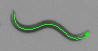

1


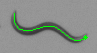

2


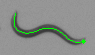

3


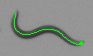

4


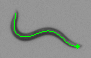

5


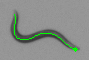

6


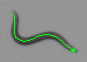

7


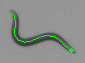

8


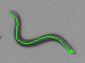

9


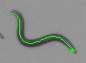

10


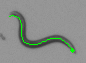

11


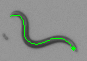

12


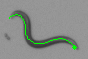

13


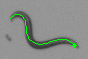

14


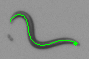

15


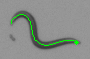

16


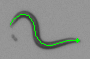

17


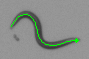

18


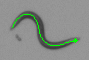

19


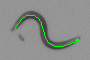

20


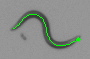

21


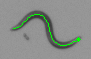

22


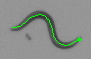

23


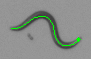

24


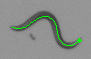

25


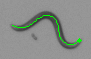

26


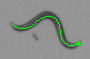

27


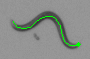

28


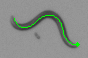

29


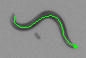

30


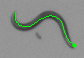

31


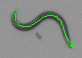

32


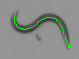

33


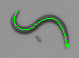

34


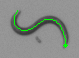

35


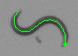

36


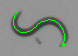

37


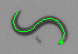

38


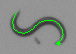

39


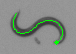

40


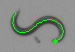

41


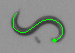

42


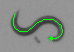

43


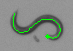

44


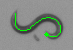

45


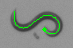

46


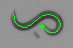

47


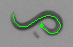

48


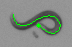

49


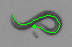

50


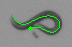

51


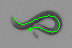

52


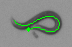

53


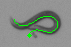

54


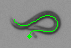

55


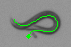

56


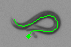

57


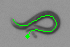

58


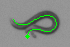

59


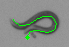

60


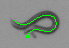

61


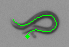

62


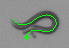

63


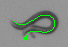

64


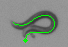

65


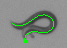

66


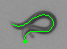

67


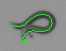

68


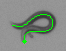

69


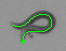

70


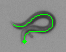

71


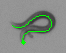

72


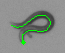

73


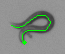

74


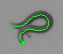

75


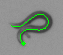

76


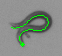

77


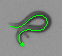

78


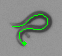

79


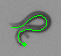

80


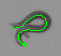

81


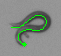

82


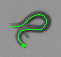

83


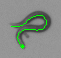

84


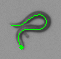

85


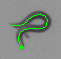

86


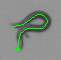

87


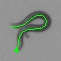

88


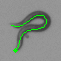

89


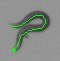

90


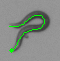

91


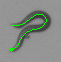

92


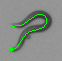

93


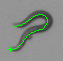

94


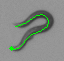

95


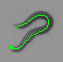

96


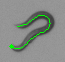

97


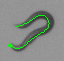

98


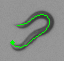

99


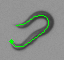

100


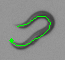

101


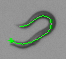

102


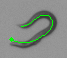

103


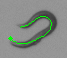

104


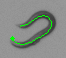

105


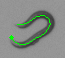

106


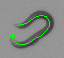

107


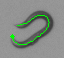

108


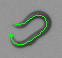

109


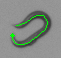

110


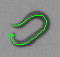

111


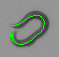

112


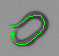

113


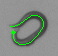

114


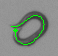

115


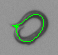

116


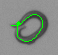

117


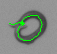

118


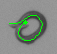

119


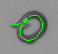

120


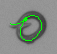

121


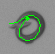

122


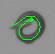

123


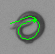

124


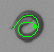

125


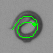

126


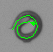

127


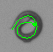

128


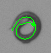

129


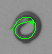

130


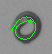

131


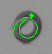

132


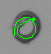

133


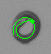

134


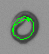

135


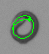

136


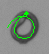

137


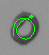

138


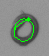

139


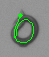

140


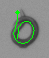

141


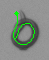

142


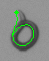

143


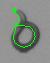

144


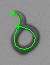

145


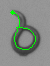

146


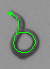

147


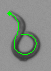

148


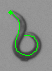

149


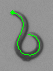

150


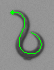

151


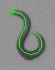

152


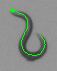

153


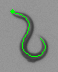

154


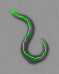

155


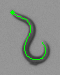

156


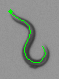

157


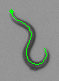

158


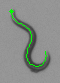

159


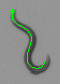

160


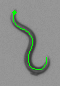

161


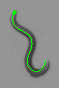

162


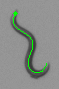

163


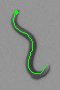

164


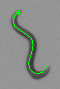

165


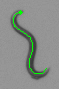

166


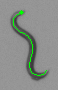

167


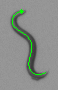

168


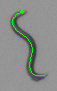

169


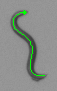

170


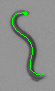

171


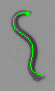

172


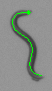

173


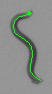

174


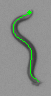

175


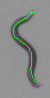

176


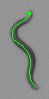

177


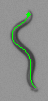

178


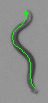

179


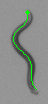

180


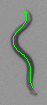

181


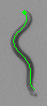

182


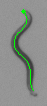

183


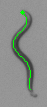

184


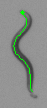

185


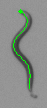

186


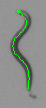

187


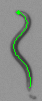

188


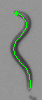

189


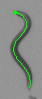

190


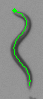

191


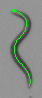

192


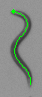

193


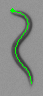

194


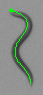

195


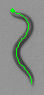

196


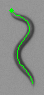

197


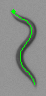

198


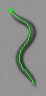

199


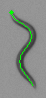

200


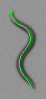

201


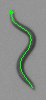

202


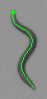

203


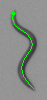

204


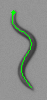

205


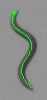

206


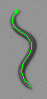

207


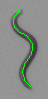

208


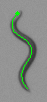

209


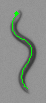

210


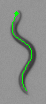

211


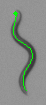

212


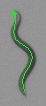

213


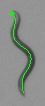

214


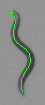

215


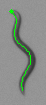

216


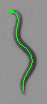

217


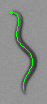

218


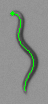

219


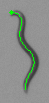

220


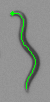

221


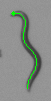

222


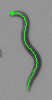

223


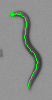

224


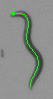

225


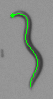

226


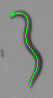

227


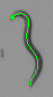

228


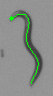

229


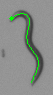

230


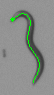

231


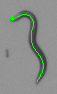

232


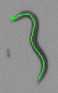

233


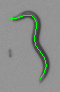

234


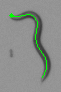

235


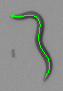

236


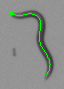

237


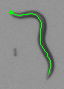

238


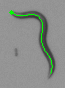

239


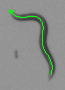

240


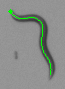

241


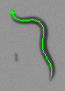

242


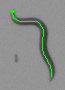

243


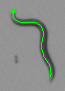

244


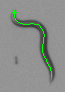

245


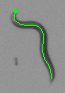

246


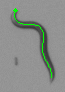

247


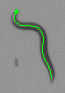

248


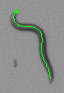

249


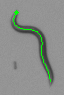

250


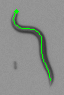

251


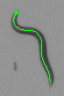

252


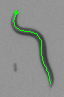

253


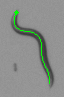

254


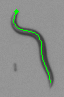

255


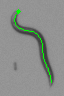

256


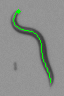

257


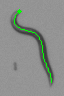

258


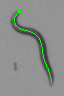

259


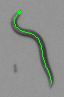

260


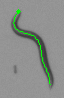

261


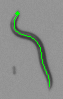

262


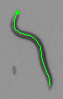

263


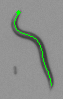

264


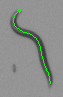

265


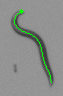

266


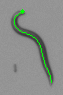

267


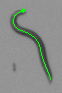

268


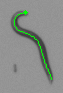

269


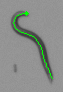

270


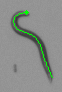

271


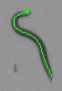

272


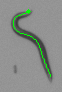

273


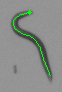

274


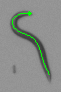

275


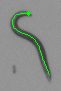

276


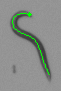

277


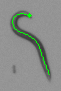

278


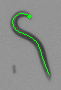

279


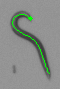

280


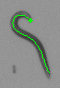

281


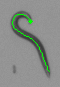

282


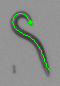

283


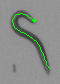

284


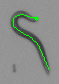

285


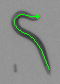

286


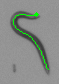

287


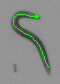

288


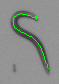

289


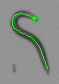

290


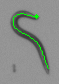

291


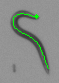

292


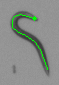

293


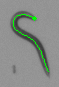

294


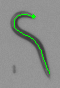

295


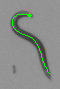

296


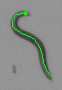

297


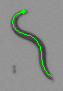

298


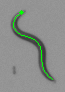

299


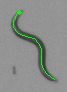

300


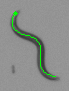

301


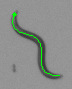

302


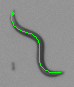

303


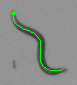

304


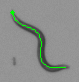

305


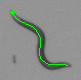

306


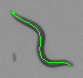

307


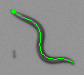

308


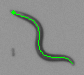

309


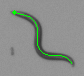

310


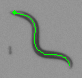

311


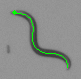

312


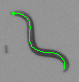

313


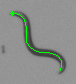

314


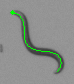

315


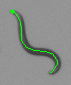

316


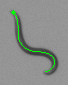

317


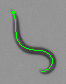

318


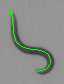

319


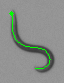

320


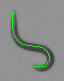

321


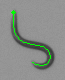

322


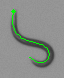

323


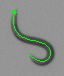

324


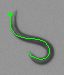

325


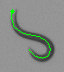

326


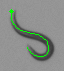

327


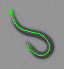

328


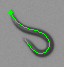

329


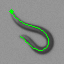

330


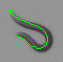

331


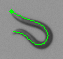

332


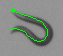

333


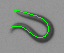

334


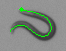

335


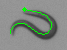

336


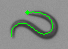

337


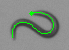

338


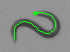

339


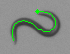

340


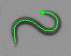

341


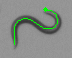

342


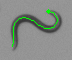

343


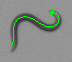

344


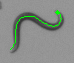

345


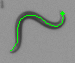

346


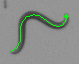

347


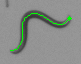

348


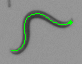

349


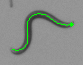

350


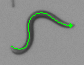

351


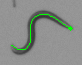

352


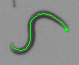

353


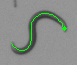

354


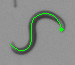

355


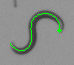

356


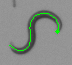

357


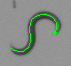

358


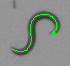

359


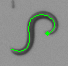

360


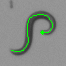

361


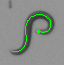

362


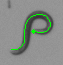

363


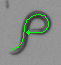

364


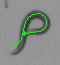

365


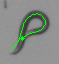

366


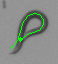

367


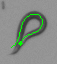

368


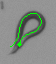

369


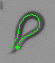

370


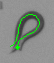

371


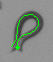

372


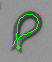

373


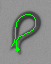

374


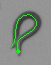

375


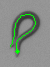

376


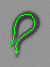

377


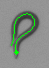

378


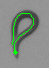

379


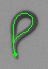

380


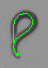

381


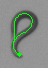

382


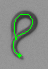

383


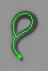

384


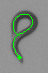

385


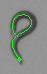

386


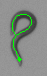

387


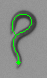

388


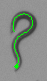

389


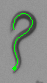

390


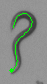

391


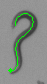

392


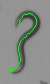

393


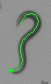

394


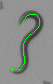

395


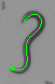

396


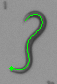

397


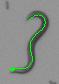

398


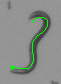

399


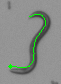

400


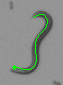

401


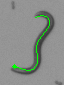

402


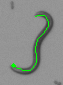

403


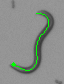

404


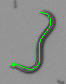

405


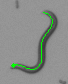

406


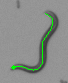

407


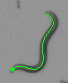

408


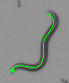

409


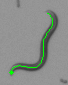

410


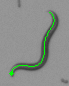

411


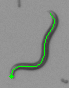

412


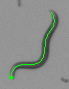

413


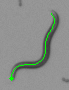

414


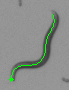

415


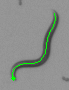

416


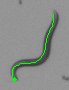

417


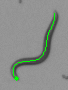

418


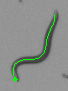

419


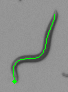

420


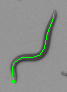

421


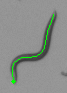

422


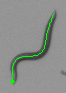

423


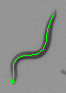

424


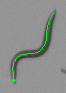

425


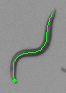

426


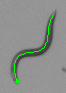

427


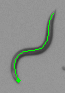

428


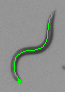

429


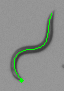

430


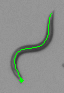

431


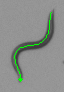

432


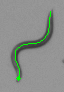

433


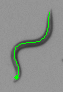

434


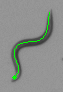

435


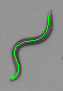

436


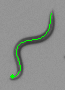

437


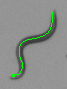

438


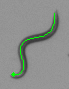

439


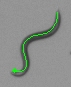

440


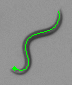

441


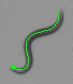

442


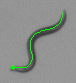

443


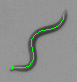

444


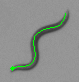

445


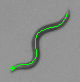

446


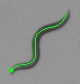

447


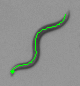

448


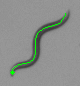

449


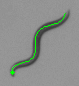

450


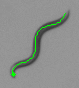

451


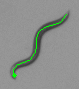

452


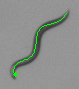

453


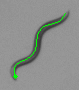

454


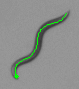

455


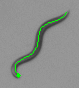

456


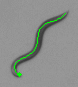

457


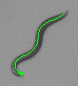

458


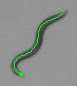

459


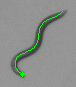

460


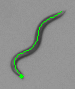

461


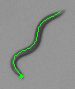

462


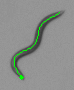

463


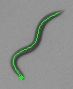

464


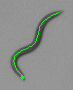

465


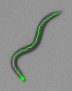

466


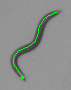

467


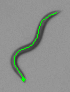

468


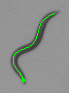

469


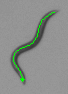

470


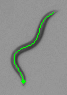

471


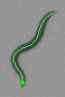

472


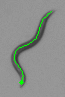

473


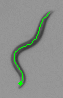

474


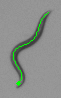

475


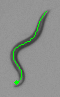

476


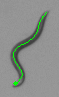

477


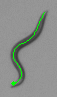

478


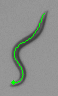

479


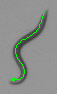

480


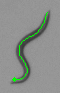

481


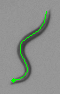

482


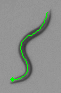

483


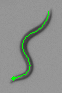

484


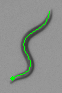

485


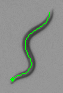

486


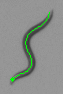

487


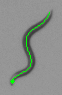

488


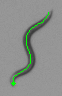

489


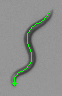

490


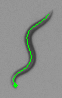

491


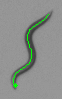

492


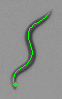

493


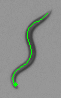

494


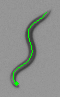

495


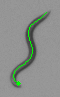

496


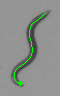

497


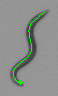

498


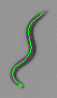

499


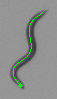

500


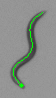

501


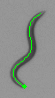

502


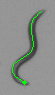

503


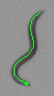

504


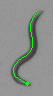

505


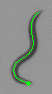

506


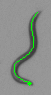

507


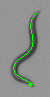

508


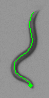

509


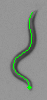

510


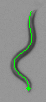

511


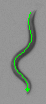

512


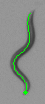

513


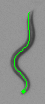

514


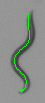

515


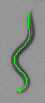

516


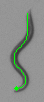

517


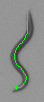

518


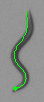

519


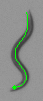

520


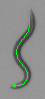

521


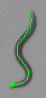

522


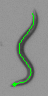

523


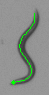

524


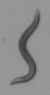

525


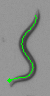

526


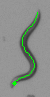

527


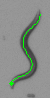

528


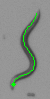

529


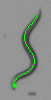

530


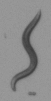

531


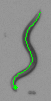

532


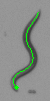

533


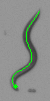

534


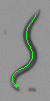

535


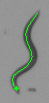

536


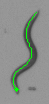

537


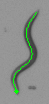

538


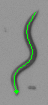

539


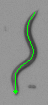

540


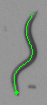

541


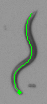

542


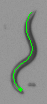

543


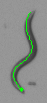

544


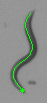

545


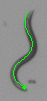

546


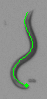

547


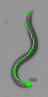

548


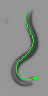

549


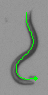

550


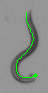

551


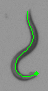

552


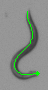

553


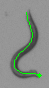

554


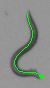

555


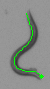

556


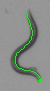

557


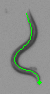

558


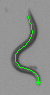

559


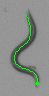

560


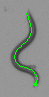

561


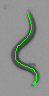

562


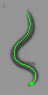

563


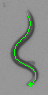

564


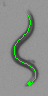

565


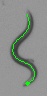

566


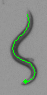

567


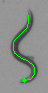

568


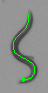

569


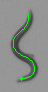

570


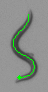

571


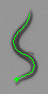

572


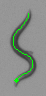

573


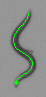

574


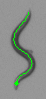

575


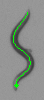

576


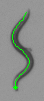

577


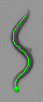

578


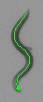

579


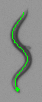

580


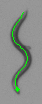

581


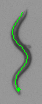

582


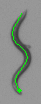

583


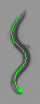

584


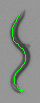

585


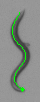

586


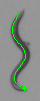

587


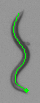

588


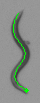

589


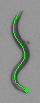

590


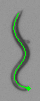

591


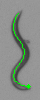

592


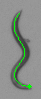

593


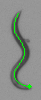

594


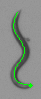

595


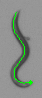

596


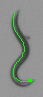

597


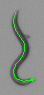

598


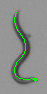

599


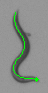

600


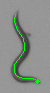

601


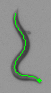

602


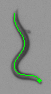

603


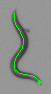

604


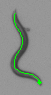

605


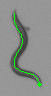

606


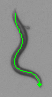

607


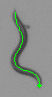

608


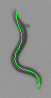

609


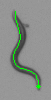

610


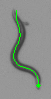

611


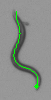

612


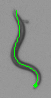

613


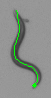

614


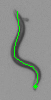

615


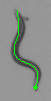

616


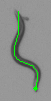

617


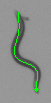

618


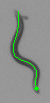

619


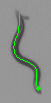

620


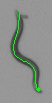

621


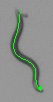

622


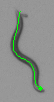

623


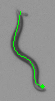

624


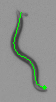

625


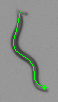

626


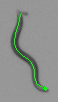

627


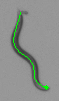

628


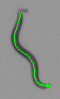

629


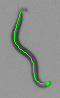

630


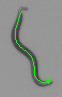

631


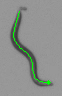

632


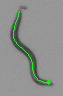

633


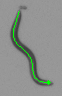

634


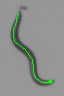

635


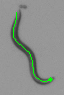

636


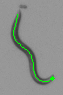

637


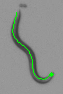

638


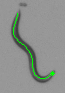

639


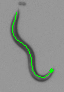

640


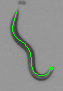

641


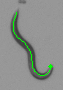

642


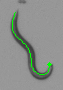

643


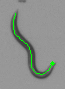

644


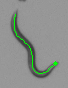

645


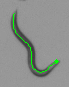

646


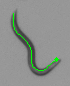

647


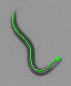

648


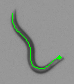

649


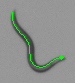

650


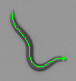

651


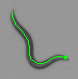

652


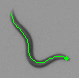

653


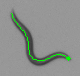

654


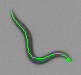

655


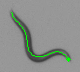

656


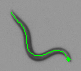

657


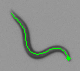

658


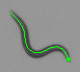

659


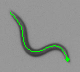

660


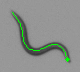

661


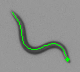

662


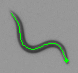

663


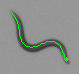

664


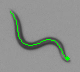

665


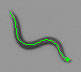

666


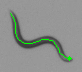

667


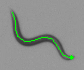

668


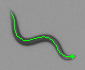

669


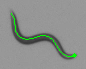

670


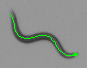

671


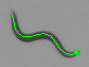

672


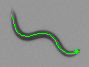

673


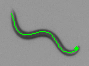

674


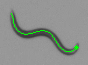

675


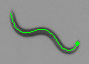

676


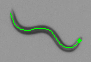

677


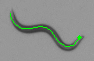

678


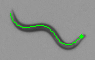

679


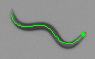

680


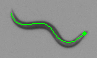

681


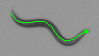

682


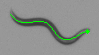

683


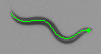

684


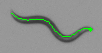

685


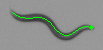

686


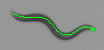

687


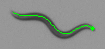

688


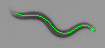

689


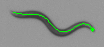

690


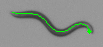

691


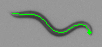

692


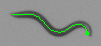

693


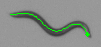

694


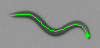

695


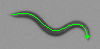

696


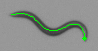

697


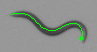

698


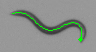

699


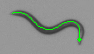

700


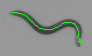

701


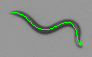

702


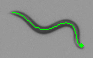

703


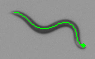

704


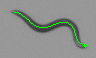

705


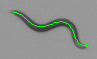

706


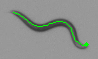

707


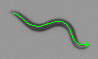

708


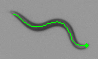

709


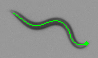

710


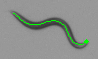

711


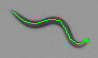

712


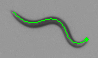

713


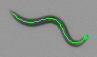

714


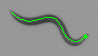

715


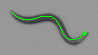

716


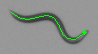

717


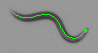

718


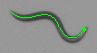

719


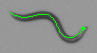

720


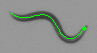

721


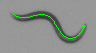

722


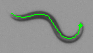

723


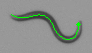

724


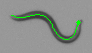

725


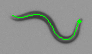

726


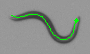

727


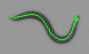

728


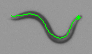

729


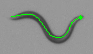

730


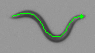

731


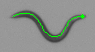

732


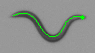

733


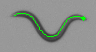

734


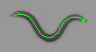

735


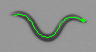

736


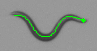

737


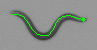

738


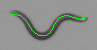

739


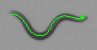

740


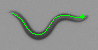

741


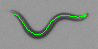

742


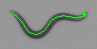

743


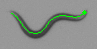

744


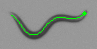

745


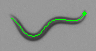

746


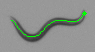

747


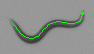

748


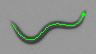

749


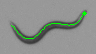

750


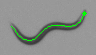

751


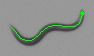

752


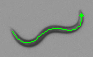

753


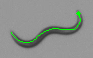

754


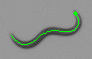

755


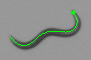

756


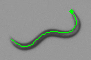

757


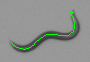

758


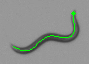

759


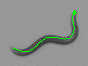

760


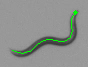

761


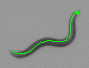

762


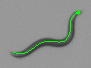

763


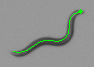

764


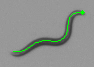

765


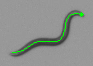

766


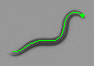

767


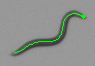

768


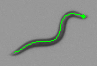

769


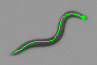

770


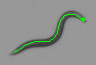

771


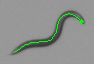

772


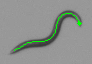

773


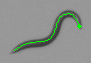

774


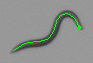

775


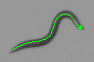

776


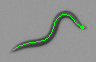

777


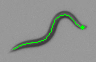

778


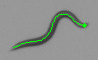

779


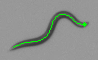

780


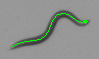

781


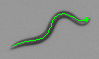

782


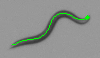

783


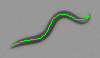

784


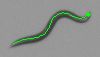

785


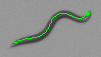

786


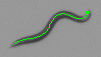

787


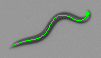

788


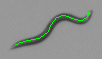

789


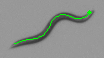

790


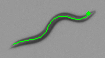

791


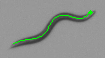

792


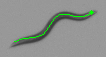

793


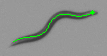

794


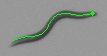

795


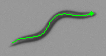

796


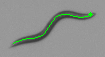

797


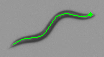

798


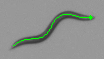

799


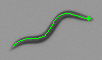

800


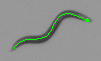

801


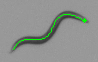

802


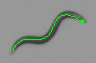

803


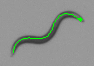

804


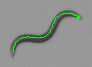

805


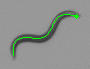

806


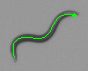

807


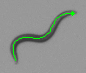

808


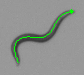

809


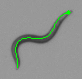

810


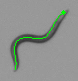

811


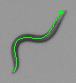

812


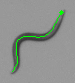

813


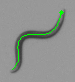

814


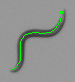

815


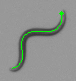

816


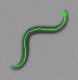

817


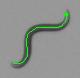

818


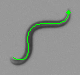

819


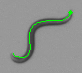

820


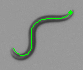

821


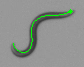

822


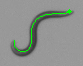

823


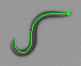

824


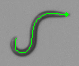

825


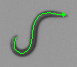

826


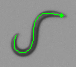

827


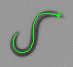

828


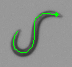

829


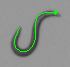

830


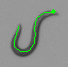

831


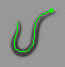

832


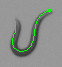

833


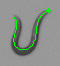

834


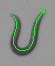

835


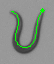

836


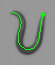

837


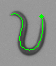

838


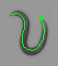

839


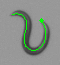

840


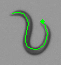

841


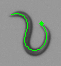

842


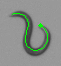

843


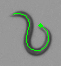

844


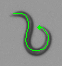

845


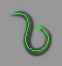

846


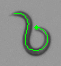

847


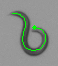

848


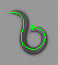

849


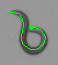

850


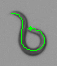

851


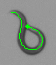

852


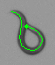

853


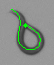

854


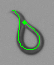

855


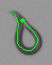

856


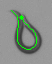

857


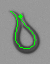

858


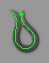

859


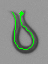

860


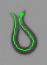

861


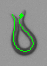

862


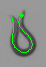

863


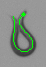

864


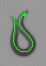

865


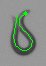

866


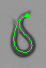

867


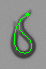

868


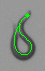

869


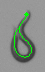

870


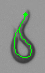

871


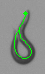

872


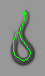

873


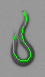

874


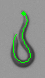

875


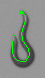

876


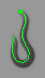

877


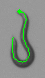

878


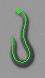

879


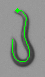

880


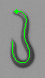

881


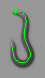

882


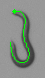

883


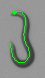

884


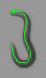

885


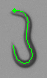

886


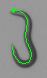

887


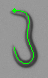

888


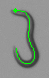

889


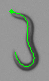

890


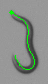

891


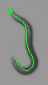

892


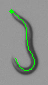

893


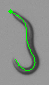

894


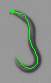

895


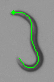

896


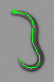

897


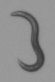

898


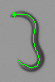

899


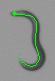

900


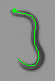

901


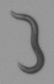

902


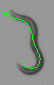

903


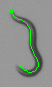

904


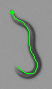

905


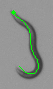

906


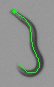

907


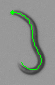

908


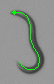

909


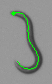

910


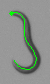

911


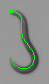

912


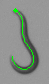

913


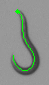

914


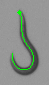

915


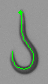

916


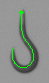

917


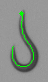

918


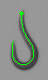

919


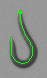

920


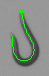

921


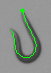

922


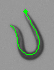

923


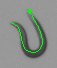

924


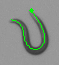

925


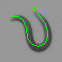

926


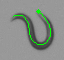

927


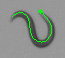

928


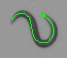

929


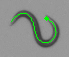

930


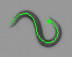

931


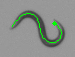

932


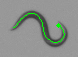

933


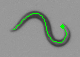

934


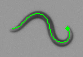

935


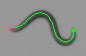

936


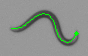

937


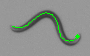

938


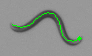

939


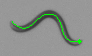

940


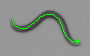

941


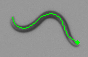

942


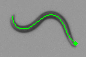

943


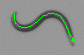

944


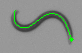

945


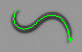

946


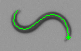

947


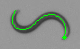

948


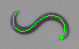

949


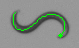

950


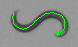

951


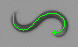

952


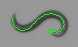

953


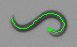

954


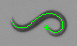

955


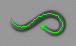

956


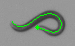

957


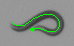

958


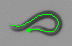

959


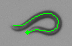

960


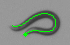

961


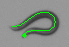

962


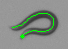

963


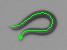

964


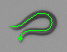

965


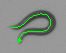

966


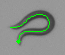

967


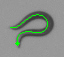

968


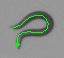

969


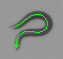

970


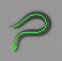

971


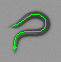

972


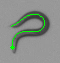

973


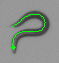

974


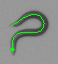

975


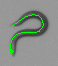

976


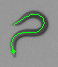

977


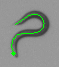

978


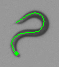

979


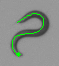

980


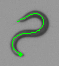

981


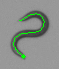

982


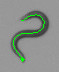

983


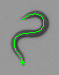

984


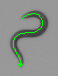

985


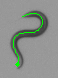

986


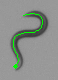

987


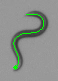

988


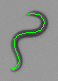

989


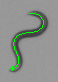

990


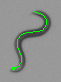

991


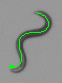

992


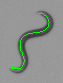

993


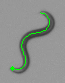

994


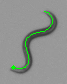

995


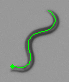

996


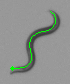

997


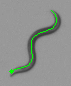

998


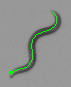

999


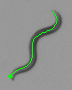

In [15]:
import os, glob
from wormpose.config import default_paths
from ipython_utils import ImagesViewer

MAX_FRAMES = 1000

img_filenames = sorted(glob.glob(os.path.join(project_dir, default_paths.RESULTS_DIR, '*','*','*.png')))[:MAX_FRAMES]
img_viewer = ImagesViewer()
for filename in img_filenames:
    img_viewer.add_image_filename(filename)

img_viewer.view_as_list(legends=range(len(img_filenames)))